In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

root_path = os.getcwd()

chicago_path = 'airbnb_Chicago.csv'
chicago = pd.read_csv(str(root_path)+'/'+chicago_path)

In [4]:
#Checking the level of the data
import pandas as pd

# Assuming df is your DataFrame
# df = pd.read_your_data_here()  # Replace with your method of creating DataFrame

def is_unique_combination(df, columns):
    grouped = df.groupby(columns).size()
    return all(grouped == 1)

is_unique_combination(chicago, ['Scraped Date','Airbnb Host ID', 'Airbnb Property ID'])

True

# Selecting only relevant columns based on use-case and variable importance

In [5]:
df=chicago

In [6]:
print("Unique Airbnb Host IDs:", df['Airbnb Host ID'].nunique())
print("Unique Census Tracts:", df['census_tract'].nunique())
print("Unique Airbnb Property IDs:", df['Airbnb Property ID'].nunique())
print("Unique Property Types:", df['Property Type'].nunique())
print("Unique Listing Types:", df['Listing Type'].nunique())
print("Unique Zipcodes:", df['Zipcode'].nunique())

print("Total Population in Census Tracts:", df['tract_total_pop'].sum())
print("Total sum of revenue in all Census Tracts:", df['revenue'].sum())

Unique Airbnb Host IDs: 13689
Unique Census Tracts: 725
Unique Airbnb Property IDs: 25845
Unique Property Types: 74
Unique Listing Types: 4
Unique Zipcodes: 56
Total Population in Census Tracts: 518639119
Total sum of revenue in all Census Tracts: 271025272.0


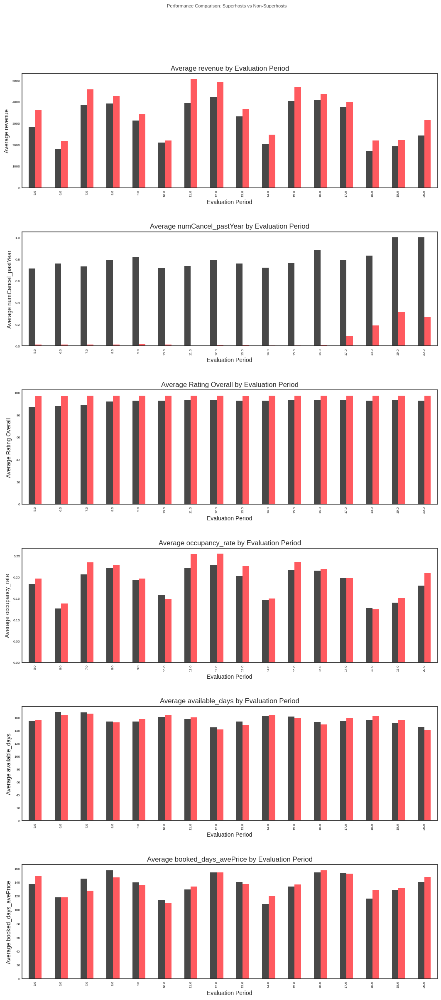

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
# Replace 'your_dataset.csv' with the path to your dataset file


# Metrics to compare
metrics = ['revenue','numCancel_pastYear', 'Rating Overall', 'occupancy_rate','available_days', 'booked_days_avePrice' ]

# Airbnb color palette (approximation)
colors = ['#484848','#FF5A5F']  # Airbnb Pink and Black
# plt.style.use('ggplot')
plt.style.use('seaborn-white')
# Set up the matplotlib figure
fig, axes = plt.subplots(len(metrics), 1, figsize=(12, 24))
fig.tight_layout(pad=6.0)

# Iterate over each metric and create a subplot
for i, metric in enumerate(metrics):
    # Group by evaluation period and superhost status, then calculate the mean
    grouped_data = df.groupby(['superhost_period_all', 'host_is_superhost_in_period'])[metric].mean().unstack()

    # Plot without legends
    grouped_data.plot(kind='bar', ax=axes[i], color=colors, edgecolor='none', legend=False)
    axes[i].set_title(f'Average {metric} by Evaluation Period', fontsize=12)
    axes[i].set_xlabel('Evaluation Period', fontsize=10)
    axes[i].set_ylabel(f'Average {metric}', fontsize=10)
    axes[i].grid(False)  # Remove gridlines
    axes[i].tick_params(axis='both', which='major', labelsize=6)

# Adjust layout
plt.subplots_adjust(top=0.95)

# Overall title
plt.suptitle('Performance Comparison: Superhosts vs Non-Superhosts', fontsize=8, color='#484848', y=1.02)

# Show the plot
plt.show()


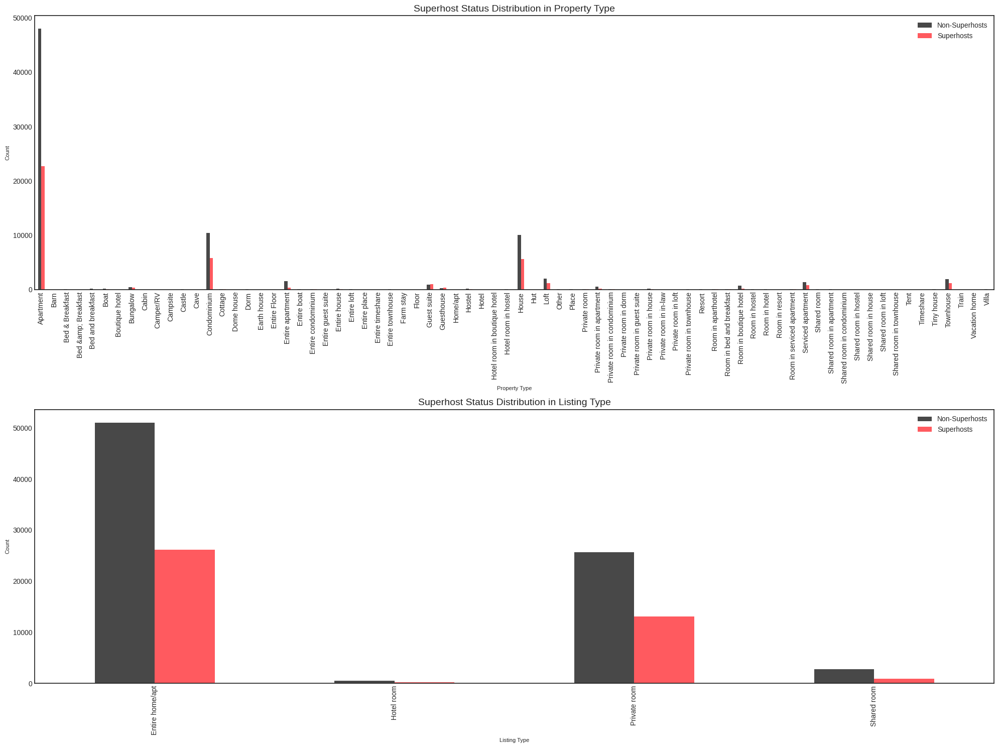

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Define the categories for analysis
categories = ['Property Type', 'Listing Type']

# Setup the plots
fig, axes = plt.subplots(nrows=len(categories), ncols=1, figsize=(20, 15))

# Iterate over each category and create a plot
for i, category in enumerate(categories):
    # Count the number of superhosts and non-superhosts in each category
    category_count = df.groupby([category, 'host_is_superhost_in_period']).size().unstack()

    # Plot
    category_count.plot(kind='bar', stacked=False, ax=axes[i], color=['#484848','#FF5A5F'])
    axes[i].set_title(f'Superhost Status Distribution in {category}', fontsize=14)
    axes[i].set_ylabel('Count', fontsize=8)
    axes[i].set_xlabel(category, fontsize=8)
    axes[i].legend(['Non-Superhosts', 'Superhosts'])
    axes[i].tick_params(axis='both', which='major', labelsize=10)

# Adjust layout
plt.tight_layout()
plt.show()


In [9]:
!pip install folium

In [10]:
import pandas as pd
import folium

# Load the dataset

# Filter to get only the rows for the latest superhost_period_all
latest_period = df['superhost_period_all'].max()
latest_superhosts = df[(df['host_is_superhost_in_period'] == 1) &
                       (df['superhost_period_all'] == latest_period) &
                       (df['City_x'] == 'Chicago')]

# Starting coordinates for Chicago map
chicago_coords = [41.8781, -87.6298]

# Create a map centered around Chicago
map_chicago = folium.Map(location=chicago_coords, zoom_start=12)

# Add markers for each Superhost
for idx, row in latest_superhosts.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Superhost: {row['Airbnb Host ID']}",
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(map_chicago)

# Save to HTML file (optional)
map_chicago.save('chicago_latest_superhosts_map.html')

# Display the map
map_chicago

In [11]:
cols_to_drop = ['Integrated Property Manager','City_x','City_y','Property Type.1','Created Date',\
                'time_to_date_mean','prev_time_to_date_mean','prev_hostResponseNumber_pastYear','prev_hostResponseAverage_pastYear']
df = df.drop(columns=cols_to_drop, axis=1)

# Data summary

In [12]:
# Display the descriptive statistics of the dataset
df[['revenue','booked_days','booked_days_avePrice']].describe()

,revenue,booked_days,booked_days_avePrice
count,82109.000000,82109.000000,82109.000000
mean,3300.798597,25.501906,137.163424
std,4697.693382,19.876955,137.930754
min,10.000000,1.000000,10.000000
25%,835.000000,9.000000,62.000000
50%,1970.000000,22.000000,99.333333
75%,4078.000000,37.000000,161.352941
max,154197.000000,220.000000,3318.500000


## Distibution of data

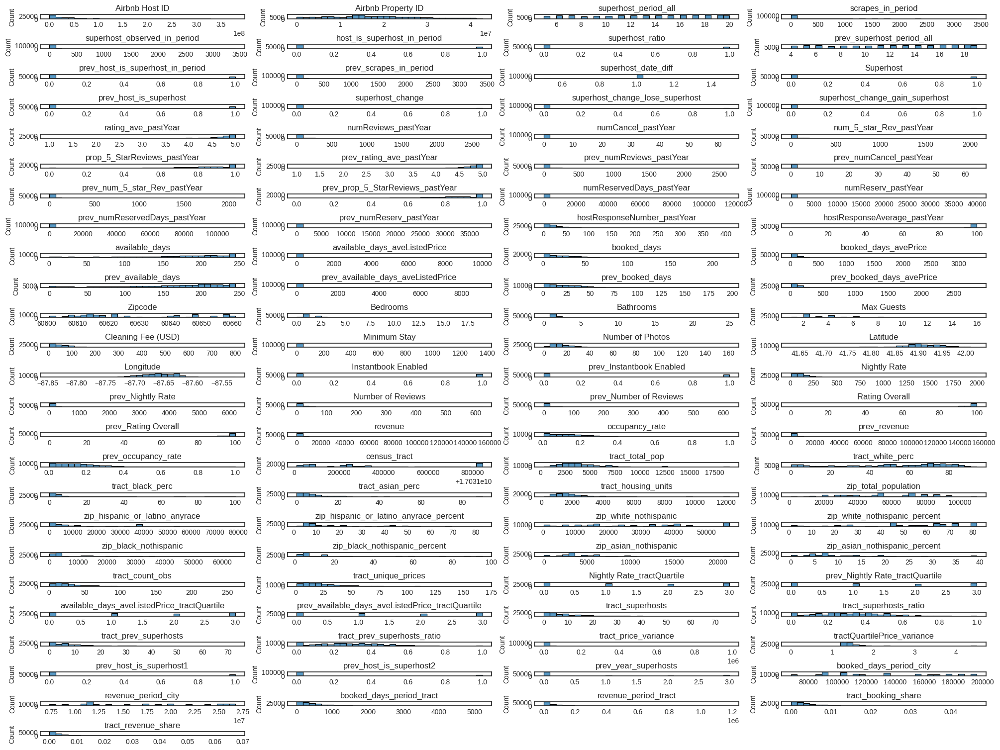

In [13]:
# Re-importing necessary libraries and re-loading the dataset as the code execution state was reset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting continuous columns (numerical columns)
continuous_columns = df.select_dtypes(include='number').columns

# Plotting histograms for each continuous variable
plt.figure(figsize=(20, 15))
for i, col in enumerate(continuous_columns):
    plt.subplot((len(continuous_columns) + 3) // 4, 4, i + 1)
    sns.histplot(df[col], kde=False, bins=30)
    plt.title(col)
    plt.xlabel('')
    plt.tight_layout()

plt.show()

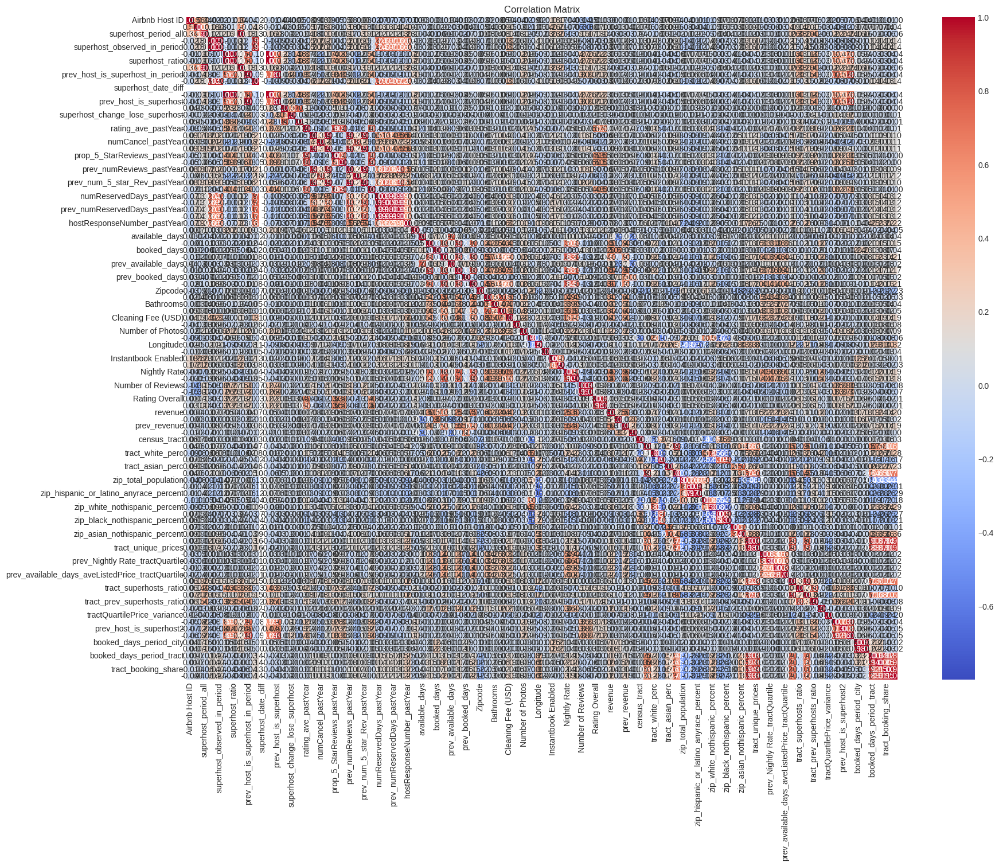

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculating the correlation matrix
corr_matrix = df.corr()

# Plotting the correlation matrix
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

## Outliers

In [15]:
#Outliers
#Run the box plot graph on all continuous variables
# Identify continuous columns
continuous_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Function to calculate outlier indices using IQR
def find_outlier_indices(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_indices = df[(df[column] < lower_bound) | (df[column] > upper_bound)].index
    return outlier_indices

# Applying the function to all continuous columns and storing indices of outliers
outlier_indices_dict = {}
for col in continuous_columns:
    outlier_indices = find_outlier_indices(df, col)
    outlier_indices_dict[col] = outlier_indices

# # Print the outlier indices for each continuous variable
# for col, indices in outlier_indices_dict.items():
#     print(f"Outliers in {col}: {indices}")
# How to handle the outliers? drop of the row?

# Data health check

## Missing values

In [16]:
#Missing values
columns_to_convert_1 = ['rating_ave_pastYear','numReviews_pastYear', 'numCancel_pastYear', 'num_5_star_Rev_pastYear', 'prop_5_StarReviews_pastYear', 'prev_rating_ave_pastYear', 'prev_numReviews_pastYear', 'prev_numCancel_pastYear', 'prev_num_5_star_Rev_pastYear',
                      'prev_prop_5_StarReviews_pastYear', 'numReservedDays_pastYear', 'numReserv_pastYear', 'prev_numReservedDays_pastYear', 'prev_numReserv_pastYear', 'hostResponseNumber_pastYear', 'hostResponseAverage_pastYear'
                       , 'available_days', 'available_days_aveListedPrice', 'booked_days', 'booked_days_avePrice', 'prev_available_days', 'prev_available_days_aveListedPrice',
                      'prev_booked_days', 'prev_booked_days_avePrice', 'Bedrooms', 'Bathrooms', 'Max Guests', 'Cleaning Fee (USD)', 'Minimum Stay', 'Number of Photos', 'Latitude', 'Longitude',
                       'Nightly Rate', 'prev_Nightly Rate', 'Number of Reviews', 'prev_Number of Reviews', 'Rating Overall', 'prev_Rating Overall', 'revenue', 'occupancy_rate', 'prev_revenue', 'prev_occupancy_rate',
                       'tract_total_pop', 'tract_white_perc', 'tract_black_perc', 'tract_asian_perc', 'tract_housing_units',
                      'tract_count_obs', 'tract_unique_prices','tract_price_variance', 'tractQuartilePrice_variance', 'booked_days_period_city', 'revenue_period_city', 'booked_days_period_tract',
                      'revenue_period_tract', 'tract_booking_share', 'tract_revenue_share']
def convert_to_numeric_replace_nulls_with_median(df, columns_to_convert_1):
    for column in columns_to_convert_1:
        if column in df.columns:
            # Convert to numeric
            df[column] = pd.to_numeric(df[column], errors='coerce')

            # Calculate median and replace null values
            median_value = df[column].median()
            df[column].fillna(median_value, inplace=True)

    # Check for null or NaN values in the specified columns
    null_values = df[columns_to_convert_1].isnull().any()
    return df
#------------------------------------------------------------------------------------
#Check for null values in categorical variables and replace with mode.
# List of columns to convert
columns_to_convert_2 = [
'Scraped Date', 'Property Type', 'Listing Type','Neighborhood','Airbnb Host ID','Airbnb Property ID','Zipcode','census_tract','Nightly Rate_tractQuartile','prev_Nightly Rate_tractQuartile','available_days_aveListedPrice_tractQuartile','prev_available_days_aveListedPrice_tractQuartile','tract_superhosts','tract_prev_superhosts']

# Function to convert specified columns to numeric and replace nulls with the mode
def convert_to_numeric_replace_nulls_with_mode(df, columns_to_convert_2):
    for column in columns_to_convert_2:
        if column in df.columns:
            # Convert to numeric
            df[column] = pd.to_numeric(df[column], errors='coerce')

            # Calculate mode and replace null values
            mode_value = df[column].mode().iloc[0] if not df[column].mode().empty else 0
            df[column].fillna(mode_value, inplace=True)

    # Check for null or NaN values in the specified columns
    null_values = df[columns_to_convert_2].isnull().any()
    return df
#------------------------------------------------------------------------------------
columns_to_convert_3 = [ 'Superhost',
                       'superhost_change_lose_superhost', 'superhost_change_gain_superhost', 'Pets Allowed',
                      'Instantbook Enabled', 'prev_Instantbook Enabled', 'prev_host_is_superhost2']

# Function to convert specified columns to numeric and replace nulls with 0
def convert_to_numeric_replace_nulls_with_zero(df, columns_to_convert_3):
    for column in columns_to_convert_3:
        if column in df.columns:
            # Convert to numeric
            df[column] = pd.to_numeric(df[column], errors='coerce')

            # Replace null values with 0
            df[column].fillna(0, inplace=True)

    # Check for null or NaN values in the specified columns
    null_values = df[columns_to_convert_3].isnull().any()

    return df
#------------------------------------------------------------------------------------

df = convert_to_numeric_replace_nulls_with_median(df, columns_to_convert_1)
df = convert_to_numeric_replace_nulls_with_mode(df, columns_to_convert_2)
df = convert_to_numeric_replace_nulls_with_zero(df, columns_to_convert_3)

In [17]:
df.isnull().values.any()

False

## Duplicates

In [18]:
# Checking for Duplicates
print("\nCheck for Duplicates:")
print(f"Duplicate rows: {df.duplicated().sum()}")


Check for Duplicates:
Duplicate rows: 0


## Special characters

In [19]:
# List of columns to convert to numeric
columns_to_convert = ['rating_ave_pastYear','numReviews_pastYear', 'numCancel_pastYear', 'num_5_star_Rev_pastYear', 'prop_5_StarReviews_pastYear', 'prev_rating_ave_pastYear', 'prev_numReviews_pastYear', 'prev_numCancel_pastYear', 'prev_num_5_star_Rev_pastYear',
                      'prev_prop_5_StarReviews_pastYear', 'numReservedDays_pastYear', 'numReserv_pastYear', 'prev_numReservedDays_pastYear', 'prev_numReserv_pastYear', 'hostResponseNumber_pastYear', 'hostResponseAverage_pastYear'
                       , 'available_days', 'available_days_aveListedPrice', 'booked_days', 'booked_days_avePrice', 'prev_available_days', 'prev_available_days_aveListedPrice',
                      'prev_booked_days', 'prev_booked_days_avePrice', 'Bedrooms', 'Bathrooms', 'Max Guests', 'Cleaning Fee (USD)', 'Minimum Stay', 'Number of Photos', 'Latitude', 'Longitude',
                       'Nightly Rate', 'prev_Nightly Rate', 'Number of Reviews', 'prev_Number of Reviews', 'Rating Overall', 'prev_Rating Overall', 'revenue', 'occupancy_rate', 'prev_revenue', 'prev_occupancy_rate',
                       'tract_total_pop', 'tract_white_perc', 'tract_black_perc', 'tract_asian_perc', 'tract_housing_units',
                      'tract_count_obs', 'tract_unique_prices','tract_price_variance', 'tractQuartilePrice_variance', 'booked_days_period_city', 'revenue_period_city', 'booked_days_period_tract',
                      'revenue_period_tract', 'tract_booking_share', 'tract_revenue_share']  # Replace with your column names

# Loop through each specified column
for column in columns_to_convert:
    # Convert the column data to numeric, replace non-numeric values with NaN
    df[column] = pd.to_numeric(df[column], errors='coerce')

    # Identify rows that couldn't be converted to numeric (i.e., had non-numeric values)
    non_numeric_rows = df[df[column].isna()]


# Findings from the dataset


*Extremely High Standard Deviations: Some columns, such as scrapes_in_period
and superhost_observed_in_period, have very high standard deviations compared to their means. This suggests a wide range of values and potential outliers.

*Minimum and Maximum Values: There are columns with minimum or maximum values that might not make sense in a business context. For example, negative values in time_to_date_mean and prev_time_to_date_mean seem illogical as they might represent time-related data.

*Zero Values in Important Fields: Some columns, like booked_days_period_city, have a significant number of entries with zero values. This could be normal depending on the context, but it might also indicate missing or incorrect data.

*Identical Mean and Median Values: Certain columns have very close mean and median values, which might be normal but could also suggest a skewed distribution of data.

*Large Differences in 25th, 50th, and 75th Percentiles: In some columns, there are large jumps between these percentiles, indicating potential skewness or irregular distribution of data.





# Exploratory data analysis

### What does out data look like across the census tracts?

### Trends of revenue, booked days and price

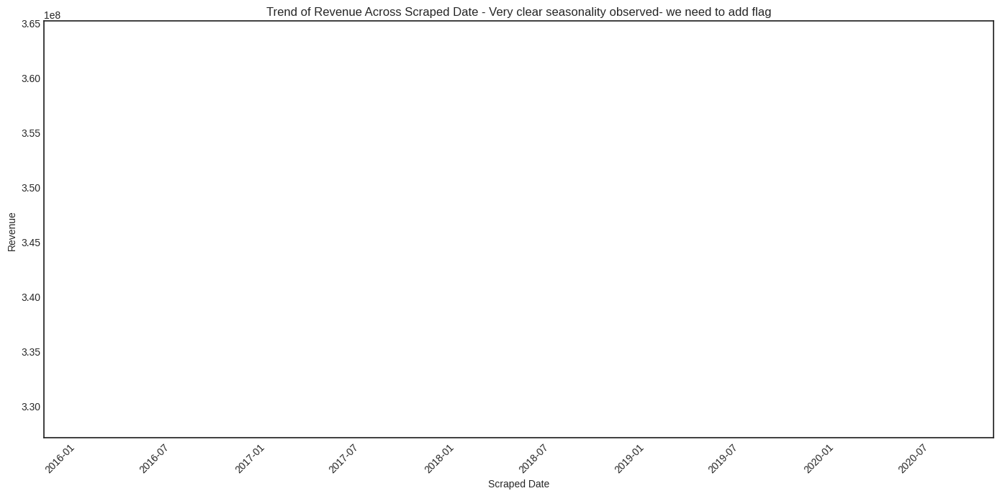

In [20]:
#Variable of interest - Revuenue and booked_days
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your dfFrame and it's already loaded

# Convert 'Scraped Date' to datetime if it's not already
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Ensure 'revenue' is a float
df['revenue'] = df['revenue'].astype(float)

# Sort the dfFrame by the 'Scraped Date'
df.sort_values('Scraped Date', inplace=True)

# Group by 'Scraped Date' and sum up the revenue for each date
revenue_trend = df.groupby('Scraped Date')['revenue'].sum()


# Plotting the trend
plt.figure(figsize=(14, 7))

# Plot the data
plt.plot(revenue_trend.index, revenue_trend.values, marker='o', linestyle='-', color='b')

# Generate a date range for ticks (every 6 months from Jan 2016 to Jan 2021)
date_range = pd.date_range(start="2016-01-01", end="2021-01-01", freq='6M')

# Setting the x-axis limits
plt.gca().set_xlim([pd.Timestamp('2016-01-01'), pd.Timestamp('2021-01-01')])

# Setting x-axis ticks
plt.gca().set_xticks(date_range)

# Formatting the date in the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Optionally, set the title and labels
plt.title('Trend of Revenue Across Scraped Date - Very clear seasonality observed- we need to add flag')
plt.xlabel('Scraped Date')
plt.ylabel('Revenue')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Use a tight layout
plt.tight_layout()

# Show the plot
plt.show()

In [21]:
# #Variable of interest - Revuenue and available_days_aveListedPrice
# import pandas as pd
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates

# import pandas as pd
# import matplotlib.pyplot as plt

# # Asmeaning df is your dfFrame and it's already loaded

# # Convert 'superhost_period_all' to datetime if it's not already
# df['superhost_period_all'] = pd.to_datetime(df['superhost_period_all'])

# # Ensure 'available_days_aveListedPrice' is a float
# df['available_days_aveListedPrice'] = df['available_days_aveListedPrice'].astype(float)

# # Sort the dfFrame by the 'superhost_period_all'
# df.sort_values('superhost_period_all', inplace=True)

# # Group by 'superhost_period_all' and mean up the available_days_aveListedPrice for each date
# available_days_aveListedPrice_trend = df.groupby('superhost_period_all')['available_days_aveListedPrice'].mean()


# # Plotting the trend
# plt.figure(figsize=(14, 7))

# # Plot the data
# plt.plot(available_days_aveListedPrice_trend.index, available_days_aveListedPrice_trend.values, marker='o', linestyle='-', color='b')

# # Generate a date range for ticks (every 6 months from Jan 2016 to Jan 2021)
# date_range = pd.date_range(start="2016-01-01", end="2021-01-01", freq='6M')

# # Setting the x-axis limits
# plt.gca().set_xlim([pd.Timestamp('2016-01-01'), pd.Timestamp('2021-01-01')])

# # Setting x-axis ticks
# plt.gca().set_xticks(date_range)

# # Formatting the date in the x-axis
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# # Optionally, set the title and labels
# plt.title('Trend of available_days_aveListedPrice Across superhost_period_all - Very clear seasonality observed')
# plt.xlabel('superhost_period_all')
# plt.ylabel('available_days_aveListedPrice')

# # Rotate the x-axis labels for better readability
# plt.xticks(rotation=45)

# # Use a tight layout
# plt.tight_layout()

# # Show the plot
# plt.show()

In [22]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Assuming 'df' is your DataFrame and has columns for 'superhost_period_all', 'revenue', and 'host_is_superhost_in_period'

# # Sort the DataFrame by 'superhost_period_all' to ensure the plot follows the chronological order
# df_sorted = df.sort_values('superhost_period_all')

# # Plot the revenue across 'superhost_period_all'
# plt.figure(figsize=(14, 7))
# sns.lineplot(data=df_sorted, x='superhost_period_all', y='revenue', marker='o', label='Revenue')

# # Add a star marker for each point where 'host_is_superhost_in_period' is 1
# # We filter the DataFrame to get only the rows where the flag is 1
# superhost_data = df_sorted[df_sorted['host_is_superhost_in_period'] == 1]
# plt.scatter(superhost_data['superhost_period_all'], superhost_data['revenue'], color='gold', marker='*', s=150, label='Superhost')

# plt.xlabel('Superhost Period')
# plt.ylabel('Revenue')
# plt.title('Revenue across Superhost Period with Superhost Flags')
# plt.xticks(rotation=45)
# plt.legend()
# plt.tight_layout()
# plt.show()
# ## aish to fix this graph

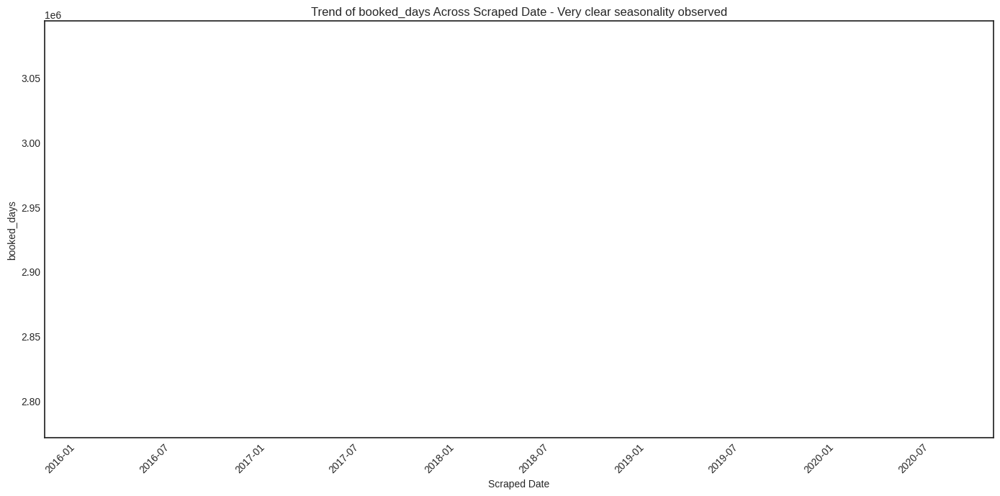

In [23]:
#Variable of interest - Revuenue and booked_days
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your dfFrame and it's already loaded

# Convert 'Scraped Date' to datetime if it's not already
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Ensure 'booked_days' is a float
df['booked_days'] = df['booked_days'].astype(float)

# Sort the dfFrame by the 'Scraped Date'
df.sort_values('Scraped Date', inplace=True)

# Group by 'Scraped Date' and sum up the booked_days for each date
booked_days_trend = df.groupby('Scraped Date')['booked_days'].sum()


# Plotting the trend
plt.figure(figsize=(14, 7))

# Plot the data
plt.plot(booked_days_trend.index, booked_days_trend.values, marker='o', linestyle='-', color='b')

# Generate a date range for ticks (every 6 months from Jan 2016 to Jan 2021)
date_range = pd.date_range(start="2016-01-01", end="2021-01-01", freq='6M')

# Setting the x-axis limits
plt.gca().set_xlim([pd.Timestamp('2016-01-01'), pd.Timestamp('2021-01-01')])

# Setting x-axis ticks
plt.gca().set_xticks(date_range)

# Formatting the date in the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Optionally, set the title and labels
plt.title('Trend of booked_days Across Scraped Date - Very clear seasonality observed')
plt.xlabel('Scraped Date')
plt.ylabel('booked_days')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Use a tight layout
plt.tight_layout()

# Show the plot
plt.show()

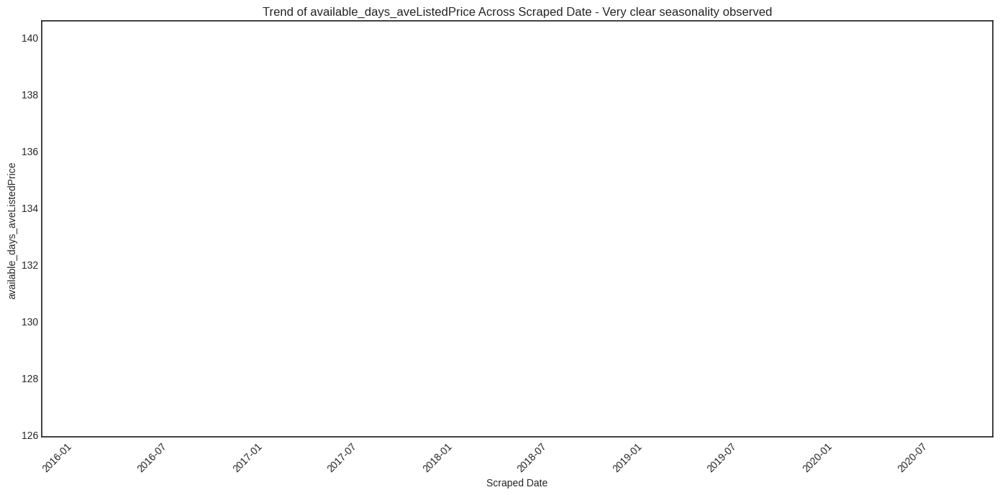

In [24]:
#Variable of interest - Revuenue and available_days_aveListedPrice
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import pandas as pd
import matplotlib.pyplot as plt

# Asmeaning df is your dfFrame and it's already loaded

# Convert 'Scraped Date' to datetime if it's not already
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Ensure 'available_days_aveListedPrice' is a float
df['available_days_aveListedPrice'] = df['available_days_aveListedPrice'].astype(float)

# Sort the dfFrame by the 'Scraped Date'
df.sort_values('Scraped Date', inplace=True)

# Group by 'Scraped Date' and mean up the available_days_aveListedPrice for each date
available_days_aveListedPrice_trend = df.groupby('Scraped Date')['available_days_aveListedPrice'].mean()


# Plotting the trend
plt.figure(figsize=(14, 7))

# Plot the data
plt.plot(available_days_aveListedPrice_trend.index, available_days_aveListedPrice_trend.values, marker='o', linestyle='-', color='b')

# Generate a date range for ticks (every 6 months from Jan 2016 to Jan 2021)
date_range = pd.date_range(start="2016-01-01", end="2021-01-01", freq='6M')

# Setting the x-axis limits
plt.gca().set_xlim([pd.Timestamp('2016-01-01'), pd.Timestamp('2021-01-01')])

# Setting x-axis ticks
plt.gca().set_xticks(date_range)

# Formatting the date in the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Optionally, set the title and labels
plt.title('Trend of available_days_aveListedPrice Across Scraped Date - Very clear seasonality observed')
plt.xlabel('Scraped Date')
plt.ylabel('available_days_aveListedPrice')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Use a tight layout
plt.tight_layout()

# Show the plot
plt.show()

## Differences between hosts and superhosts

### Avg Revenue of Superhost and host(ALL)

In [25]:
import pandas as pd


# Convert the 'Scraped Date' column to datetime format
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Filter the data for values between January 2016 and June 2020
filtered_df = df[(df['Scraped Date'] >= '2016-01-01') & (df['Scraped Date'] <= '2019-06-30')]

# Calculate average revenue for Superhosts and non-Superhosts
superhost_avg_revenue = filtered_df[filtered_df['Superhost'] == 1]['revenue'].mean()
non_superhost_avg_revenue = filtered_df[filtered_df['Superhost'] == 0]['revenue'].mean()

print(f'Average Revenue for Superhosts: ${superhost_avg_revenue:.2f}')
print(f'Average Revenue for Non-Superhosts: ${non_superhost_avg_revenue:.2f}')

Average Revenue for Superhosts: $nan
Average Revenue for Non-Superhosts: $nan


###Difference in revenue between Superhosts and non-Superhosts(ALL)

In [26]:
from scipy.stats import ttest_ind
df=chicago


# Convert the 'Scraped Date' column to datetime format
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Filter the data for values between January 2016 and June 2020
filtered_df = df[(df['Scraped Date'] >= '2016-01-01') & (df['Scraped Date'] <= '2020-06-30')]

# Remove rows with missing or zero revenue values
filtered_df = filtered_df[(filtered_df['revenue'].notnull()) & (filtered_df['revenue'] != 0)]

# Separate revenue for Superhosts and non-Superhosts
superhost_revenue = filtered_df[filtered_df['Superhost'] == 1]['revenue']
non_superhost_revenue = filtered_df[filtered_df['Superhost'] == 0]['revenue']

# Perform t-test
t_statistic, p_value = ttest_ind(superhost_revenue, non_superhost_revenue, equal_var=False, nan_policy='omit')

# Check the p-value
alpha = 0.05
print(f'Test Statistic: {t_statistic:.4f}')
print(f'P-value: {p_value:.4f}')

# Check for significance
if p_value < alpha:
    print("The difference in revenue between Superhosts and non-Superhosts is statistically significant.")
else:
    print("There is no significant difference in revenue between Superhosts and non-Superhosts.")

Test Statistic: 12.8048
P-value: 0.0000
The difference in revenue between Superhosts and non-Superhosts is statistically significant.


###Difference in booked days averaged price between Superhosts and non-Superhosts

In [27]:
from scipy.stats import ttest_ind


# Convert the 'Scraped Date' column to datetime format
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Filter the data for values between Jan 2016 and June 2020
filtered_df = df[(df['Scraped Date'] >= '2016-01-01') & (df['Scraped Date'] <= '2020-06-30')]

# Remove rows with missing or zero values in the 'booked_days_avePrice' column
filtered_df = filtered_df[(filtered_df['booked_days_avePrice'].notnull()) & (filtered_df['booked_days_avePrice'] != 0)]

# Separate booked days' average price for Superhosts and non-Superhosts
superhost_avg_price = filtered_df[filtered_df['Superhost'] == 1]['booked_days_avePrice']
non_superhost_avg_price = filtered_df[filtered_df['Superhost'] == 0]['booked_days_avePrice']

# Print out the average booked days' average price for both Superhosts and non-Superhosts
print(f'Average Booked Days\' Average Price for Superhosts: ${superhost_avg_price.mean():.2f}')
print(f'Average Booked Days\' Average Price for Non-Superhosts: ${non_superhost_avg_price.mean():.2f}')

# Perform t-test
t_statistic, p_value = ttest_ind(superhost_avg_price, non_superhost_avg_price, equal_var=False, nan_policy='omit')

# Check the p-value
alpha = 0.05
print(f'\nTest Statistic: {t_statistic:.4f}')
print(f'P-value: {p_value:.4f}')

# Check for significance
if p_value < alpha:
    print("Difference in booked days' average price between Superhosts and non-Superhosts is significant.")
else:
    print("No significant difference in booked days' average price between Superhosts and non-Superhosts.")

Average Booked Days' Average Price for Superhosts: $138.09
Average Booked Days' Average Price for Non-Superhosts: $136.56

Test Statistic: 1.5655
P-value: 0.1175
No significant difference in booked days' average price between Superhosts and non-Superhosts.


###The difference in occupancy rate,available days, and booked days between Superhosts and non-Superhosts(ALL)

In [28]:
from scipy.stats import ttest_ind


# Convert the 'Scraped Date' column to datetime format
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Filter the data for values between Jan 2016 and June 2020
filtered_df = df[(df['Scraped Date'] >= '2016-01-01') & (df['Scraped Date'] <= '2020-06-30')]

# Remove rows with missing or zero values in the relevant columns
filtered_df = filtered_df[(filtered_df['occupancy_rate'].notnull()) & (filtered_df['occupancy_rate'] != 0)]
filtered_df = filtered_df[(filtered_df['available_days'].notnull()) & (filtered_df['available_days'] != 0)]
filtered_df = filtered_df[(filtered_df['booked_days'].notnull()) & (filtered_df['booked_days'] != 0)]

# Separate data for Superhosts and non-Superhosts
superhost_occupancy_rate = filtered_df[filtered_df['Superhost'] == 1]['occupancy_rate']
non_superhost_occupancy_rate = filtered_df[filtered_df['Superhost'] == 0]['occupancy_rate']

superhost_available_days = filtered_df[filtered_df['Superhost'] == 1]['available_days']
non_superhost_available_days = filtered_df[filtered_df['Superhost'] == 0]['available_days']

superhost_booked_days = filtered_df[filtered_df['Superhost'] == 1]['booked_days']
non_superhost_booked_days = filtered_df[filtered_df['Superhost'] == 0]['booked_days']

# Print out the statistics
print(f'Occupancy Rate for Superhosts: Mean={superhost_occupancy_rate.mean():.4f}, Std={superhost_occupancy_rate.std():.4f}')
print(f'Occupancy Rate for Non-Superhosts: Mean={non_superhost_occupancy_rate.mean():.4f}, Std={non_superhost_occupancy_rate.std():.4f}')

print(f'\nAvailable Days for Superhosts: Mean={superhost_available_days.mean():.4f}, Std={superhost_available_days.std():.4f}')
print(f'Available Days for Non-Superhosts: Mean={non_superhost_available_days.mean():.4f}, Std={non_superhost_available_days.std():.4f}')

print(f'\nBooked Days for Superhosts: Mean={superhost_booked_days.mean():.4f}, Std={superhost_booked_days.std():.4f}')
print(f'Booked Days for Non-Superhosts: Mean={non_superhost_booked_days.mean():.4f}, Std={non_superhost_booked_days.std():.4f}')

# Perform t-tests
t_stat_occ, p_value_occ = ttest_ind(superhost_occupancy_rate, non_superhost_occupancy_rate, equal_var=False, nan_policy='omit')
t_stat_avail, p_value_avail = ttest_ind(superhost_available_days, non_superhost_available_days, equal_var=False, nan_policy='omit')
t_stat_booked, p_value_booked = ttest_ind(superhost_booked_days, non_superhost_booked_days, equal_var=False, nan_policy='omit')

# Check the p-values
alpha = 0.05




# Check for significance
if p_value_occ < alpha:
    print(f'\nOccupancy Rate Hypothesis Test: Test Statistic={t_stat_occ:.4f}, P-value={p_value_occ:.4f}')
    print("The difference in occupancy rate between Superhosts and non-Superhosts is statistically significant.")
else:
    print("There is no significant difference in occupancy rate between Superhosts and non-Superhosts.")

if p_value_avail < alpha:
    print(f'Available Days Hypothesis Test: Test Statistic={t_stat_avail:.4f}, P-value={p_value_avail:.4f}')
    print("The difference in available days between Superhosts and non-Superhosts is statistically significant.")
else:
    print("There is no significant difference in available days between Superhosts and non-Superhosts.")

if p_value_booked < alpha:
    print(f'Booked Days Hypothesis Test: Test Statistic={t_stat_booked:.4f}, P-value={p_value_booked:.4f}')
    print("The difference in booked days between Superhosts and non-Superhosts is statistically significant.")
else:
    print("There is no significant difference in booked days between Superhosts and non-Superhosts.")

Occupancy Rate for Superhosts: Mean=0.1976, Std=0.1755
Occupancy Rate for Non-Superhosts: Mean=0.1874, Std=0.1819

Available Days for Superhosts: Mean=160.8186, Std=58.2751
Available Days for Non-Superhosts: Mean=164.1106, Std=64.9598

Booked Days for Superhosts: Mean=26.7478, Std=19.7449
Booked Days for Non-Superhosts: Mean=24.6932, Std=19.9208

Occupancy Rate Hypothesis Test: Test Statistic=8.0201, P-value=0.0000
The difference in occupancy rate between Superhosts and non-Superhosts is statistically significant.
Available Days Hypothesis Test: Test Statistic=-7.5559, P-value=0.0000
The difference in available days between Superhosts and non-Superhosts is statistically significant.
Booked Days Hypothesis Test: Test Statistic=14.5162, P-value=0.0000
The difference in booked days between Superhosts and non-Superhosts is statistically significant.


##Decide the probability for a host to become a superhost(ALL)

Accuracy: 0.9365
Confusion Matrix:
[[311  17]
 [ 15 161]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95       328
         1.0       0.90      0.91      0.91       176

    accuracy                           0.94       504
   macro avg       0.93      0.93      0.93       504
weighted avg       0.94      0.94      0.94       504

AUC: 0.9762
MAPE: 0.0957
        Airbnb Host ID  Superhost  Predicted Probability
0               2153.0        0.0                    0.0
5               2613.0        1.0                    0.0
21              5775.0        1.0                    0.0
37             14175.0        0.0                    0.0
38             15365.0        0.0                    0.0
...                ...        ...                    ...
120211     141528449.0        0.0                    0.0
120213      44131859.0        1.0                    0.0
120214      72165035.0        0.0                    0

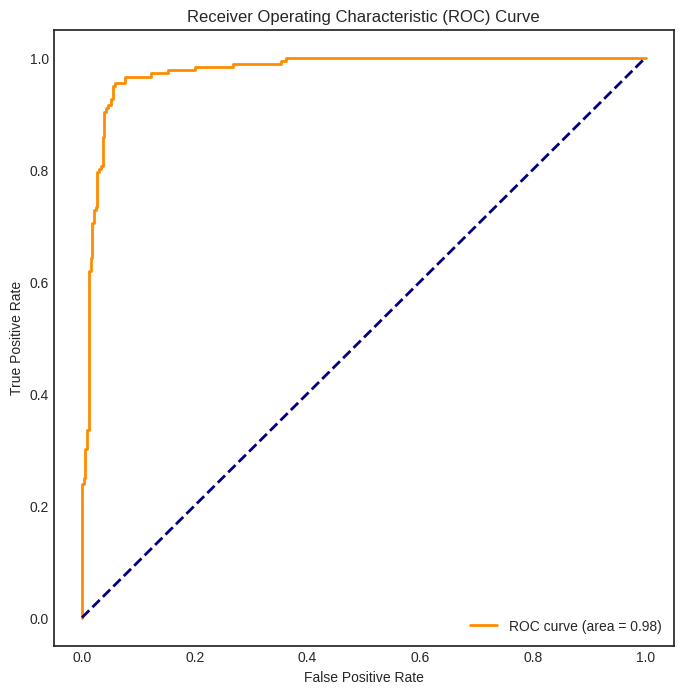

In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, mean_absolute_error
import matplotlib.pyplot as plt

# Convert the 'Scraped Date' column to datetime format
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Filter the data for values between Jan 2016 and Jun 2020
filtered_df = df[(df['Scraped Date'] >= '2016-01-01') & (df['Scraped Date'] <= '2020-06-30')]

# Keep only unique samples based on 'Airbnb Host ID'
filtered_df = filtered_df.drop_duplicates(subset='Airbnb Host ID', keep='first')

# Selecting all relevant features for gradient boosting
features = ['rating_ave_pastYear', 'numReviews_pastYear', 'numCancel_pastYear', 'num_5_star_Rev_pastYear',
            'prop_5_StarReviews_pastYear', 'prev_rating_ave_pastYear', 'prev_numReviews_pastYear',
            'prev_numCancel_pastYear', 'prev_num_5_star_Rev_pastYear', 'numReservedDays_pastYear',
            'numReserv_pastYear', 'prev_numReservedDays_pastYear', 'prev_numReserv_pastYear',
            'available_days', 'available_days_aveListedPrice', 'booked_days', 'booked_days_avePrice',
            'prev_available_days', 'prev_available_days_aveListedPrice', 'prev_available_days',
            'prev_available_days_aveListedPrice', 'prev_booked_days', 'prev_booked_days_avePrice',
            'Nightly Rate', 'prev_Nightly Rate', 'Number of Reviews', 'prev_Number of Reviews',
            'Rating Overall', 'prev_Rating Overall', 'revenue', 'occupancy_rate', 'prev_revenue',
            'prev_occupancy_rate', 'tract_total_pop', 'tract_white_perc', 'tract_black_perc',
            'tract_asian_perc', 'tract_housing_units', 'zip_hispanic_or_latino_anyrace',
            'zip_white_nothispanic', 'zip_black_nothispanic', 'zip_asian_nothispanic',
            'tract_count_obs', 'tract_unique_prices', 'Nightly Rate_tractQuartile',
            'prev_Nightly Rate_tractQuartile', 'available_days_aveListedPrice_tractQuartile',
            'prev_available_days_aveListedPrice_tractQuartile', 'tract_superhosts',
            'tract_prev_superhosts', 'tract_price_variance', 'tractQuartilePrice_variance']

# Drop columns specified in cols_to_drop
features = [feature for feature in features if feature not in cols_to_drop]

# Creating feature matrix X and target variable y
X = filtered_df[features]
y = filtered_df['Superhost']

# Drop rows with missing values
X = X.dropna()
y = y[X.index]  # Align y with the remaining rows in X

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initializing the gradient boosting model and fitting on the training data
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

# Making predictions on the testing data
predictions = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy:.4f}')

# Confusion matrix
conf_matrix = confusion_matrix(y_test, predictions)
print(f'Confusion Matrix:\n{conf_matrix}')

# Classification report
class_report = classification_report(y_test, predictions)
print(f'Classification Report:\n{class_report}')

# Calculate AUC
predicted_probabilities = model.predict_proba(X_test)[:, 1]
auc = roc_auc_score(y_test, predicted_probabilities)
print(f'AUC: {auc:.4f}')

# Calculate MAPE
mape = mean_absolute_error(y_test, predicted_probabilities)
print(f'MAPE: {mape:.4f}')

# Add a new column to the original dataframe for predicted probabilities
filtered_df['Predicted Probability'] = 0  # Initialize with zeros
filtered_df.loc[X_test.index, 'Predicted Probability'] = predicted_probabilities

# Display predicted probabilities in the original dataframe
print(filtered_df[['Airbnb Host ID', 'Superhost', 'Predicted Probability']])

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, predicted_probabilities)
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


Accuracy: 0.9405
Confusion Matrix:
[[313  15]
 [ 15 161]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95       328
         1.0       0.91      0.91      0.91       176

    accuracy                           0.94       504
   macro avg       0.93      0.93      0.93       504
weighted avg       0.94      0.94      0.94       504

AUC: 0.9753
        Airbnb Host ID  Superhost  Predicted Probability
0               2153.0        0.0                    0.0
5               2613.0        1.0                    0.0
21              5775.0        1.0                    0.0
37             14175.0        0.0                    0.0
38             15365.0        0.0                    0.0
...                ...        ...                    ...
120211     141528449.0        0.0                    0.0
120213      44131859.0        1.0                    0.0
120214      72165035.0        0.0                    0.0
120215    

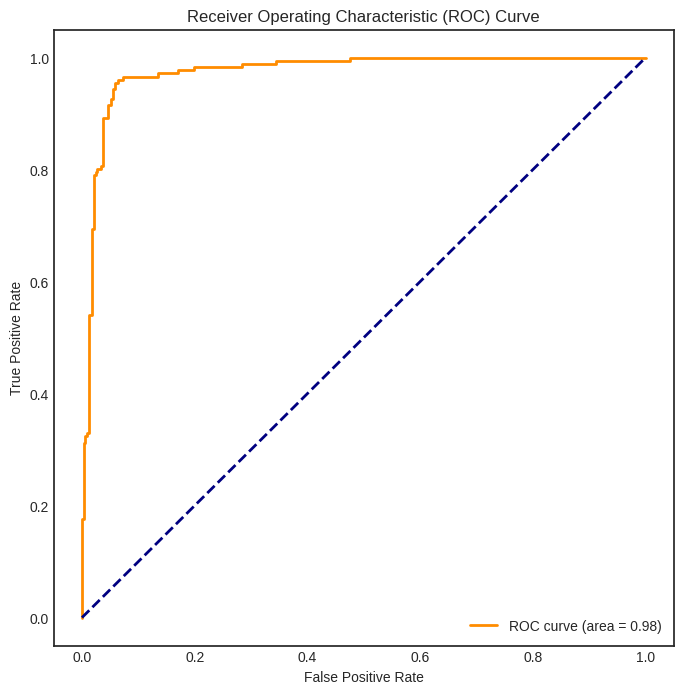

In [30]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Convert the 'Scraped Date' column to datetime format
df['Scraped Date'] = pd.to_datetime(df['Scraped Date'])

# Filter the data for values between Jan 2016 and Jun 2020
filtered_df = df[(df['Scraped Date'] >= '2016-01-01') & (df['Scraped Date'] <= '2020-06-30')]

# Keep only unique samples based on 'Airbnb Host ID'
filtered_df = filtered_df.drop_duplicates(subset='Airbnb Host ID', keep='first')

# Selecting all relevant features for gradient boosting
features = ['rating_ave_pastYear', 'numReviews_pastYear', 'numCancel_pastYear', 'num_5_star_Rev_pastYear',
            'prop_5_StarReviews_pastYear', 'prev_rating_ave_pastYear', 'prev_numReviews_pastYear',
            'prev_numCancel_pastYear', 'prev_num_5_star_Rev_pastYear', 'numReservedDays_pastYear',
            'numReserv_pastYear', 'prev_numReservedDays_pastYear', 'prev_numReserv_pastYear',
            'available_days', 'available_days_aveListedPrice', 'booked_days', 'booked_days_avePrice',
            'prev_available_days', 'prev_available_days_aveListedPrice', 'prev_available_days',
            'prev_available_days_aveListedPrice', 'prev_booked_days', 'prev_booked_days_avePrice',
            'Nightly Rate', 'prev_Nightly Rate', 'Number of Reviews', 'prev_Number of Reviews',
            'Rating Overall', 'prev_Rating Overall', 'revenue', 'occupancy_rate', 'prev_revenue',
            'prev_occupancy_rate', 'tract_total_pop', 'tract_white_perc', 'tract_black_perc',
            'tract_asian_perc', 'tract_housing_units', 'zip_hispanic_or_latino_anyrace',
            'zip_white_nothispanic', 'zip_black_nothispanic', 'zip_asian_nothispanic',
            'tract_count_obs', 'tract_unique_prices', 'Nightly Rate_tractQuartile',
            'prev_Nightly Rate_tractQuartile', 'available_days_aveListedPrice_tractQuartile',
            'prev_available_days_aveListedPrice_tractQuartile', 'tract_superhosts',
            'tract_prev_superhosts', 'tract_price_variance', 'tractQuartilePrice_variance']

# Drop columns specified in cols_to_drop
features = [feature for feature in features if feature not in cols_to_drop]

# Creating feature matrix X and target variable y
X = filtered_df[features]
y = filtered_df['Superhost']

# Drop rows with missing values
X = X.dropna()
y = y[X.index]  # Align y with the remaining rows in X

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initializing the gradient boosting model and fitting on the training data
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

# Making predictions on the testing data
predictions = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy:.4f}')

# Confusion matrix
conf_matrix = confusion_matrix(y_test, predictions)
print(f'Confusion Matrix:\n{conf_matrix}')

# Classification report
class_report = classification_report(y_test, predictions)
print(f'Classification Report:\n{class_report}')

# Calculate AUC
predicted_probabilities = model.predict_proba(X_test)[:, 1]
auc = roc_auc_score(y_test, predicted_probabilities)
print(f'AUC: {auc:.4f}')

# Add a new column to the original dataframe for predicted probabilities
filtered_df['Predicted Probability'] = 0  # Initialize with zeros
filtered_df.loc[X_test.index, 'Predicted Probability'] = predicted_probabilities

# Display predicted probabilities in the original dataframe
print(filtered_df[['Airbnb Host ID', 'Superhost', 'Predicted Probability']])

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, predicted_probabilities)
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# Where is the revenue being generated? - Lets focus on the low hanging fruit

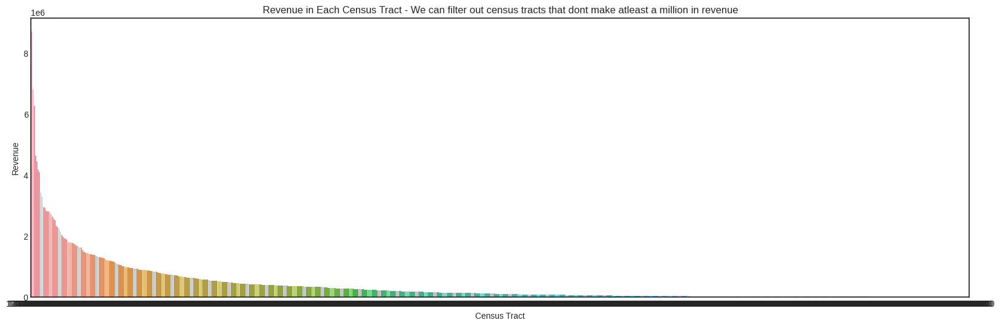

In [31]:
# Group the data by Census Tract and calculate the total revenue in each tract
tract_revenue = df.groupby('census_tract')['revenue'].sum().reset_index()
tract_revenue = tract_revenue.sort_values(by='revenue', ascending=False)
# Create a bar chart using seaborn
plt.figure(figsize=(20, 6))
sns.barplot(x='census_tract', y='revenue', data=tract_revenue,order=tract_revenue['census_tract'])
plt.xlabel('Census Tract')
plt.ylabel('Revenue')
plt.title('Revenue in Each Census Tract - We can filter out census tracts that dont make atleast a million in revenue')
plt.show()

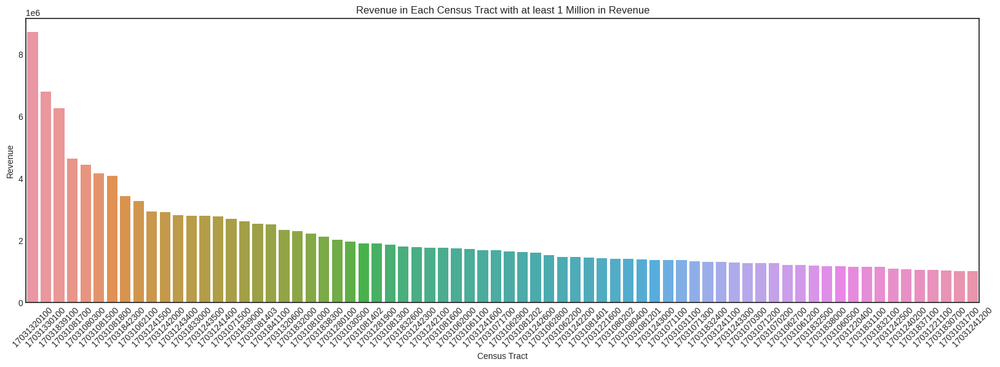

In [32]:
# Assuming df is your DataFrame and it has columns 'census_tract' and 'revenue'

# Group the data by Census Tract and calculate the total revenue in each tract
tract_revenue = df.groupby('census_tract')['revenue'].sum().reset_index()

# Filter out tracts with less than 1 million in revenue
tracts_with_million_revenue = tract_revenue[tract_revenue['revenue'] >= 1e6]

# Find tracts that don't have at least 1 million in revenue
tracts_less_than_million = tract_revenue[tract_revenue['revenue'] < 1e6]
tracts_to_drop = tracts_less_than_million['census_tract'].tolist()

# Drop these tracts from the original DataFrame
df_filtered = df[~df['census_tract'].isin(tracts_to_drop)]

# Group the filtered data by Census Tract and calculate the total revenue in each tract again
tract_revenue_filtered = df_filtered.groupby('census_tract')['revenue'].sum().reset_index()

# Sort the DataFrame by revenue in descending order
tract_revenue_filtered_sorted = tract_revenue_filtered.sort_values(by='revenue', ascending=False)

# Create a bar chart using seaborn with the filtered and sorted data
plt.figure(figsize=(20, 6))
barplot = sns.barplot(x='census_tract', y='revenue', data=tract_revenue_filtered_sorted, order=tract_revenue_filtered_sorted['census_tract'])
plt.xlabel('Census Tract')
plt.ylabel('Revenue')
plt.title('Revenue in Each Census Tract with at least 1 Million in Revenue')
plt.xticks(rotation=45)  # Rotate the x labels (census tract ticks) 45 degrees
plt.show()


In [33]:
print("Unique Airbnb Host IDs:", df_filtered['Airbnb Host ID'].nunique())
print("Unique Census Tracts:", df_filtered['census_tract'].nunique())
print("Unique Airbnb Property IDs:", df_filtered['Airbnb Property ID'].nunique())
print("Unique Property Types:", df_filtered['Property Type'].nunique())
print("Unique Listing Types:", df_filtered['Listing Type'].nunique())
print("Unique Zipcodes:", df_filtered['Zipcode'].nunique())

print("Total Population in Census Tracts:", df_filtered['tract_total_pop'].sum())
print("Total sum of revenue in all Census Tracts:", df_filtered['revenue'].sum())

Unique Airbnb Host IDs: 5504
Unique Census Tracts: 72
Unique Airbnb Property IDs: 11215
Unique Property Types: 60
Unique Listing Types: 4
Unique Zipcodes: 22
Total Population in Census Tracts: 279759027
Total sum of revenue in all Census Tracts: 152317393.0


In [34]:
df_filtered['revenue'].isnull().sum()

16097

In [35]:
df_filtered.shape

(51110, 111)

### Here on we use only filtered data for census tracts which have revenue more than a million

In [36]:
df = df_filtered

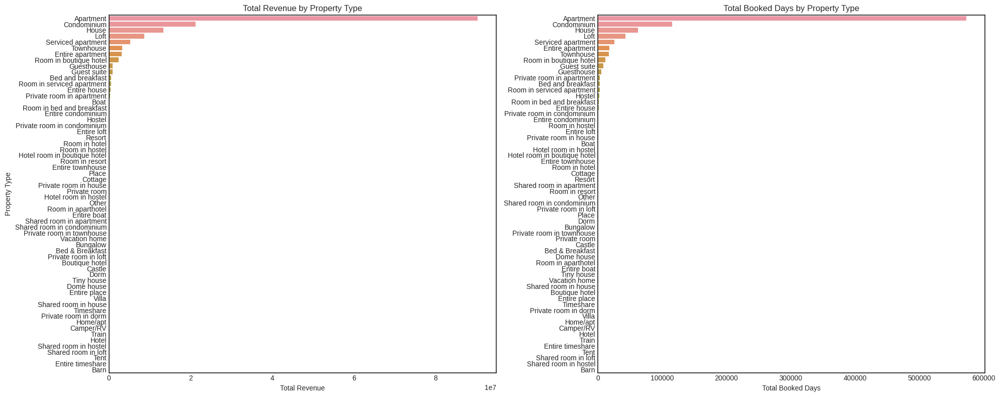

In [37]:
# Assuming df is your DataFrame and it has columns 'Property Type', 'revenue', and 'booked_days'

# Group by Property Type and calculate total revenue and total booked_days for each type
property_type_aggregated = df.groupby('Property Type').agg({'revenue': 'sum', 'booked_days': 'sum'}).reset_index()

# Create subplots with 1 row and 2 columns
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

# Create a bar chart for total revenue by Property Type
sns.barplot(x='revenue', y='Property Type', data=property_type_aggregated.sort_values('revenue', ascending=False), ax=ax[0])
ax[0].set_title('Total Revenue by Property Type')
ax[0].set_xlabel('Total Revenue')
ax[0].set_ylabel('Property Type')

# Create a bar chart for total booked_days by Property Type
sns.barplot(x='booked_days', y='Property Type', data=property_type_aggregated.sort_values('booked_days', ascending=False), ax=ax[1])
ax[1].set_title('Total Booked Days by Property Type')
ax[1].set_xlabel('Total Booked Days')
ax[1].set_ylabel('')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


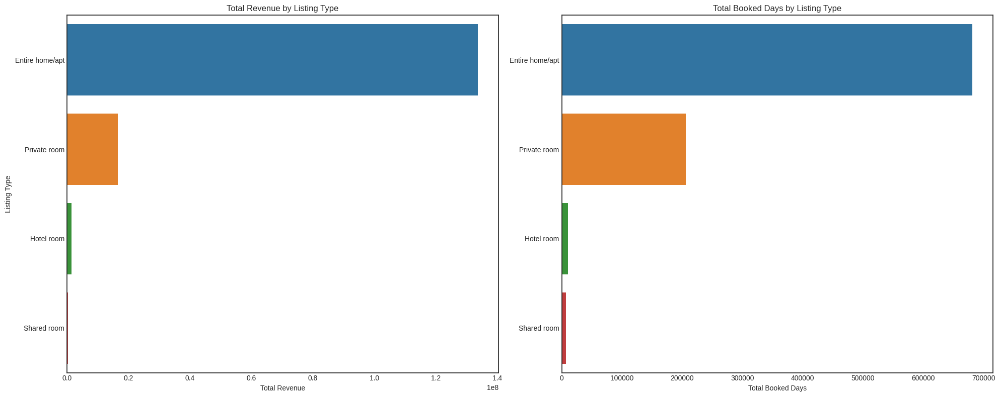

In [38]:
# Assuming df is your DataFrame and it has columns 'Listing Type', 'revenue', and 'booked_days'

# Group by Listing Type and calculate total revenue and total booked_days for each type
property_type_aggregated = df.groupby('Listing Type').agg({'revenue': 'sum', 'booked_days': 'sum'}).reset_index()

# Create subplots with 1 row and 2 columns
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

# Create a bar chart for total revenue by Listing Type
sns.barplot(x='revenue', y='Listing Type', data=property_type_aggregated.sort_values('revenue', ascending=False), ax=ax[0])
ax[0].set_title('Total Revenue by Listing Type')
ax[0].set_xlabel('Total Revenue')
ax[0].set_ylabel('Listing Type')

# Create a bar chart for total booked_days by Listing Type
sns.barplot(x='booked_days', y='Listing Type', data=property_type_aggregated.sort_values('booked_days', ascending=False), ax=ax[1])
ax[1].set_title('Total Booked Days by Listing Type')
ax[1].set_xlabel('Total Booked Days')
ax[1].set_ylabel('')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

Prediction models for revenue

In [39]:
## Gradient boost cleaning

In [40]:
df = chicago
# #Filter unnecessary columns
cols_to_drop = ['Integrated Property Manager','City_x','City_y','Property Type.1','Created Date',\
                'time_to_date_mean','prev_time_to_date_mean','prev_hostResponseNumber_pastYear','prev_hostResponseAverage_pastYear']
df = df.drop(columns=cols_to_drop, axis=1)
# cols_to_drop = ['Integrated Property Manager','City_x','City_y','Property Type.1','superhost_period_all','tract_superhosts_ratio','tract_prev_superhosts_ratio',\
#                 'prev_host_is_superhost1','prev_year_superhosts','host_is_superhost_in_period','prev_host_is_superhost_in_period','superhost_change','zip_total_population',\
#                 'zip_hispanic_or_latino_anyrace_percent','zip_white_nothispanic_percent','zip_black_nothispanic_percent',\
#                 'zip_asian_nothispanic_percent','prev_hostResponseNumber_pastYear','prev_hostResponseAverage_pastYear','time_to_date_mean','prev_time_to_date_mean']

In [41]:
#Missing values
columns_to_convert_1 = ['rating_ave_pastYear','numReviews_pastYear', 'numCancel_pastYear', 'num_5_star_Rev_pastYear', 'prop_5_StarReviews_pastYear', 'prev_rating_ave_pastYear', 'prev_numReviews_pastYear', 'prev_numCancel_pastYear', 'prev_num_5_star_Rev_pastYear',
                      'prev_prop_5_StarReviews_pastYear', 'numReservedDays_pastYear', 'numReserv_pastYear', 'prev_numReservedDays_pastYear', 'prev_numReserv_pastYear', 'hostResponseNumber_pastYear', 'hostResponseAverage_pastYear'
                       , 'available_days', 'available_days_aveListedPrice', 'booked_days', 'booked_days_avePrice', 'prev_available_days', 'prev_available_days_aveListedPrice',
                      'prev_booked_days', 'prev_booked_days_avePrice', 'Bedrooms', 'Bathrooms', 'Max Guests', 'Cleaning Fee (USD)', 'Minimum Stay', 'Number of Photos', 'Latitude', 'Longitude',
                       'Nightly Rate', 'prev_Nightly Rate', 'Number of Reviews', 'prev_Number of Reviews', 'Rating Overall', 'prev_Rating Overall', 'revenue', 'occupancy_rate', 'prev_revenue', 'prev_occupancy_rate',
                       'tract_total_pop', 'tract_white_perc', 'tract_black_perc', 'tract_asian_perc', 'tract_housing_units',
                      'tract_count_obs', 'tract_unique_prices','tract_price_variance', 'tractQuartilePrice_variance', 'booked_days_period_city', 'revenue_period_city', 'booked_days_period_tract',
                      'revenue_period_tract', 'tract_booking_share', 'tract_revenue_share']
def convert_to_numeric_replace_nulls_with_median(df, columns_to_convert_1):
    for column in columns_to_convert_1:
        if column in df.columns:
            # Convert to numeric
            df[column] = pd.to_numeric(df[column], errors='coerce')

            # Calculate median and replace null values
            median_value = df[column].median()
            df[column].fillna(median_value, inplace=True)

    # Check for null or NaN values in the specified columns
    null_values = df[columns_to_convert_1].isnull().any()
    return df
#------------------------------------------------------------------------------------
#Check for null values in categorical variables and replace with mode.
# List of columns to convert
columns_to_convert_2 = ['Property Type', 'Listing Type','Neighborhood','Airbnb Host ID','Airbnb Property ID','Zipcode','census_tract','Nightly Rate_tractQuartile','prev_Nightly Rate_tractQuartile','available_days_aveListedPrice_tractQuartile','prev_available_days_aveListedPrice_tractQuartile','tract_superhosts','tract_prev_superhosts']

# Function to convert specified columns to numeric and replace nulls with the mode
def convert_to_numeric_replace_nulls_with_mode(df, columns_to_convert_2):
    for column in columns_to_convert_2:
        if column in df.columns:
            # Convert to numeric
            df[column] = pd.to_numeric(df[column], errors='coerce')

            # Calculate mode and replace null values
            mode_value = df[column].mode().iloc[0] if not df[column].mode().empty else 0
            df[column].fillna(mode_value, inplace=True)

    # Check for null or NaN values in the specified columns
    null_values = df[columns_to_convert_2].isnull().any()
    return df
#------------------------------------------------------------------------------------
columns_to_convert_3 = [ 'Superhost',
                       'superhost_change_lose_superhost', 'superhost_change_gain_superhost', 'Pets Allowed',
                      'Instantbook Enabled', 'prev_Instantbook Enabled', 'prev_host_is_superhost2']

# Function to convert specified columns to numeric and replace nulls with 0
def convert_to_numeric_replace_nulls_with_zero(df, columns_to_convert_3):
    for column in columns_to_convert_3:
        if column in df.columns:
            # Convert to numeric
            df[column] = pd.to_numeric(df[column], errors='coerce')

            # Replace null values with 0
            df[column].fillna(0, inplace=True)

    # Check for null or NaN values in the specified columns
    null_values = df[columns_to_convert_3].isnull().any()

    return df
#------------------------------------------------------------------------------------

df = convert_to_numeric_replace_nulls_with_median(df, columns_to_convert_1)
df = convert_to_numeric_replace_nulls_with_mode(df, columns_to_convert_2)
df = convert_to_numeric_replace_nulls_with_zero(df, columns_to_convert_3)

In [42]:
#Outliers
# Group the data by Census Tract and calculate the total revenue in each tract
tract_revenue = df.groupby('census_tract')['revenue'].sum().reset_index()

# Filter out tracts with less than 1 million in revenue
tracts_with_million_revenue = tract_revenue[tract_revenue['revenue'] >= 1e6]

# Find tracts that don't have at least 1 million in revenue
tracts_less_than_million = tract_revenue[tract_revenue['revenue'] < 1e6]
tracts_to_drop = tracts_less_than_million['census_tract'].tolist()

# Drop these tracts from the original DataFrame
df_filtered = df[~df['census_tract'].isin(tracts_to_drop)]
#Standardization

continuous_columns = ['rating_ave_pastYear','numReviews_pastYear','numCancel_pastYear', 'num_5_star_Rev_pastYear', 'prop_5_StarReviews_pastYear','prev_rating_ave_pastYear', \
                      'prev_numReviews_pastYear', 'prev_numCancel_pastYear','prev_num_5_star_Rev_pastYear','prev_prop_5_StarReviews_pastYear','numReservedDays_pastYear',\
                      'numReserv_pastYear', 'prev_numReservedDays_pastYear','prev_numReserv_pastYear', 'hostResponseNumber_pastYear', 'hostResponseAverage_pastYear',\
                      'available_days', 'available_days_aveListedPrice', 'booked_days', 'booked_days_avePrice','prev_available_days', 'prev_available_days_aveListedPrice',\
                      'prev_booked_days', 'prev_booked_days_avePrice', 'Bedrooms', 'Bathrooms','Max Guests', 'Cleaning Fee (USD)', 'Minimum Stay', 'Number of Photos',\
                      'Latitude','Longitude','Nightly Rate', 'prev_Nightly Rate', 'Number of Reviews','prev_Number of Reviews', 'Rating Overall', 'prev_Rating Overall',\
                      'occupancy_rate', 'prev_occupancy_rate','tract_total_pop','tract_white_perc', 'tract_black_perc', 'tract_asian_perc', 'tract_housing_units',\
                      'tract_count_obs', 'tract_unique_prices','tract_price_variance', 'tractQuartilePrice_variance','booked_days_period_city', 'revenue_period_city',\
                      'booked_days_period_tract','revenue_period_tract','tract_booking_share', 'tract_revenue_share']
df_filtered[continuous_columns]

from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
standard_scaler = StandardScaler()

# Scale the continuous columns
df_filtered[continuous_columns] = standard_scaler.fit_transform(df_filtered[continuous_columns])


# Assuming 'df' is your panel DataFrame with a 'time' column
# Let's say 'time' is in a format like 'YYYY-MM' or 'YYYY'

# Convert 'time' to a string if it's not already, to ensure it works well with get_dummies
df_filtered['Scraped Date'] = df_filtered['Scraped Date'].astype(str)

# Create time dummy variables
time_dummies = pd.get_dummies(df['superhost_period_all'], prefix='superhost_period_all')
print(df_filtered.shape)
# Join the dummy variables back to your original dataframe
df_filtered = pd.concat([df_filtered, time_dummies], axis=1)
print(df_filtered.shape)

(61139, 102)
(120217, 118)


In [43]:
df_filtered = df_filtered.dropna(subset=['Airbnb Host ID', 'Airbnb Property ID','superhost_period_all'], how='all')
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error
columns = [
    'booked_days', 'prev_booked_days', 'prev_booked_days_avePrice', 'booked_days_avePrice',
    'available_days_aveListedPrice', 'prev_available_days_aveListedPrice', 'available_days',
    'prev_available_days', 'Superhost', 'Cleaning Fee (USD)', 'occupancy_rate', 'prev_occupancy_rate',
    'Nightly Rate', 'prev_Nightly Rate', 'Bedrooms', 'Bathrooms', 'Number of Photos',
    'revenue', 'prev_revenue', 'Number of Reviews', 'prev_Number of Reviews','Airbnb Host ID', 'Airbnb Property ID', 'superhost_period_all'
]
grouped = df_filtered[columns].groupby(['superhost_period_all', 'Airbnb Host ID', 'Airbnb Property ID','Superhost'])

# Perform aggregation
aggregated_data = grouped.agg({
    'booked_days': 'sum',
    'prev_booked_days': 'sum',
    'prev_booked_days_avePrice': 'mean',
    'booked_days_avePrice': 'mean',
    'available_days_aveListedPrice': 'mean',
    'prev_available_days_aveListedPrice': 'mean',
    'available_days': 'sum',
    'prev_available_days': 'mean',
    'Cleaning Fee (USD)': 'mean',
    'occupancy_rate': 'mean',
    'prev_occupancy_rate': 'mean',
    'Nightly Rate': 'mean',
    'prev_Nightly Rate': 'mean',
    'Bedrooms': 'mean',
    'Bathrooms': 'mean',
    'Number of Photos': 'mean',
    'revenue': 'sum',
    'prev_revenue': 'sum',
    'Number of Reviews': 'sum',
    'prev_Number of Reviews': 'sum'})

# Reset the index to make grouped variables regular columns
aggregated_data.reset_index(inplace=True)


# Reset the index to make grouped variables regular columns
aggregated_data.reset_index(inplace=True)
# aggregated_data.columns = [col.replace(' ', '_') for col in aggregated_data.columns]

#'Nightly_Rate_tractQuartile', 'prev_Nightly_Rate_tractQuartile','available_days_aveListedPrice_tractQuartile','prev_available_days_aveListedPrice_tractQuartile','tract_prev_superhosts','tract_superhosts',
# Define categorical features
categorical_features = ['Airbnb Host ID','Airbnb Property ID','superhost_period_all','Superhost']

# Convert categorical columns to type 'category'
for cat_feature in categorical_features:
    aggregated_data[cat_feature] = aggregated_data[cat_feature].astype('category')




# Perform the necessary aggregations and preprocessing on both subsets
# Note: Repeat the aggregation and preprocessing steps for both superhost_data and non_superhost_data

# Train a model for superhost listings
X_superhost = aggregated_data.drop('revenue', axis=1)
y_superhost = aggregated_data['revenue']
X_train_superhost, X_test_superhost, y_train_superhost, y_test_superhost = train_test_split(X_superhost, y_superhost, test_size=0.3, random_state=42)
model_superhost = lgb.LGBMRegressor(objective='regression')
model_superhost.fit(X_train_superhost, y_train_superhost, categorical_feature=categorical_features)
y_pred_superhost = model_superhost.predict(X_test_superhost)
# Calculate MAPE for the superhost model on its validation set
y_pred_val_superhost = model_superhost.predict(X_test_superhost)
mape_superhost = mean_absolute_percentage_error(y_test_superhost, y_pred_val_superhost)

print("MAPE on the Validation Set for Superhost Model:", mape_superhost)

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13394
[LightGBM] [Info] Number of data points in the train set: 42797, number of used features: 24
[LightGBM] [Info] Start training from score 3479.139706
MAPE on the Validation Set for Superhost Model: 0.033388698405795836


In [44]:
from sklearn.metrics import mean_squared_error, r2_score

# Function to calculate regression metrics and feature importance
def evaluate_regression_model(model, X_test, y_test, features):
    y_pred = model.predict(X_test)

    # Regression metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Feature importance
    feature_importance = pd.DataFrame({
        'feature': features,
        'importance': model.feature_importances_
    }).sort_values(by='importance', ascending=False)

    return mse, r2, feature_importance

# Evaluate Superhost model
mse_superhost, r2_superhost, feature_importance_superhost = evaluate_regression_model(
    model_superhost, X_test_superhost, y_test_superhost, X_superhost.columns
)
print("MAPE on the Validation Set for Superhost Model:", mape_superhost)
print("MSE for Superhost Model:", mse_superhost)
print("R-squared for Superhost Model:", r2_superhost)
print("Feature Importance for Superhost Model:\n", feature_importance_superhost)

MAPE on the Validation Set for Superhost Model: 0.033388698405795836
MSE for Superhost Model: 224325.26450103635
R-squared for Superhost Model: 0.9895288358892635
Feature Importance for Superhost Model:
                                feature  importance
5                          booked_days         901
8                 booked_days_avePrice         767
13                  Cleaning Fee (USD)         148
9        available_days_aveListedPrice         144
14                      occupancy_rate         103
2                       Airbnb Host ID          93
16                        Nightly Rate          92
10  prev_available_days_aveListedPrice          87
18                            Bedrooms          81
7            prev_booked_days_avePrice          66
21                        prev_revenue          60
22                   Number of Reviews          56
15                 prev_occupancy_rate          55
0                                index          47
17                   prev_Night